In [1]:
!pip install --quiet opencv-python torch torchvision captum 
# matplotlib==3.3.4 Flask-Compress

In [2]:
import sys
sys.path.insert(1, '../')
import helpers, os
from PIL import Image
import cv2, numpy as np
import matplotlib.pyplot as plt
import pandas as pd

## Setup

### Load a Model

In [3]:
models_base_pth = "/home/local/data/sophie/padcxr14_models/step_decay_cxr14/arch_seg/"
full_config_path = "full_network/{}/lr_step_decay_10_epochs_0.1_rate/model_lr_0.0005_bsz_16_mom_0.99_seed_{}_pos-weight_1.0.pth/model_17.pth"

base_full_model = helpers.models.load_trained_resnet50(os.path.join(models_base_pth,full_config_path.format("base","42")),device="cpu")
grey_full_model = helpers.models.load_trained_resnet50(os.path.join(models_base_pth,full_config_path.format("grey","42")),device="cpu")
# single_full_model = helpers.models.load_trained_resnet50(os.path.join(models_base_pth,full_config_path.format("grey","42")),device="cpu")

In [4]:
def convert_to_uint8(image):
    uint8_image = image-image.min()
    uint8_image = uint8_image / uint8_image.max() * 255
    uint8_image = uint8_image.astype(np.uint8)
    return uint8_image

### Load in a Singular Image

In [5]:
data_root = "/home/local/data/sophie/node21_combined"
dataset_name = "cxr14"
process = "arch"
std_dir = "std_1024"
crop_size = 512

bbox_df = helpers.bboxes.read_bounding_boxes("/home/local/data/sophie/node21_combined/all_bboxes.csv")
device = helpers.models.get_device()
cxr_test = helpers.dataloading.load_dataset_with_paths(
    dataset_path=os.path.join(data_root, dataset_name, "test"),
    dataset_name=dataset_name,
    process=process,
    crop_size=crop_size,
    batch_size=1,
    shuffle=False
)

In [6]:
i = 0
for data in cxr_test:
    pos_inputs, pos_labels = data[0],data[1]
    pos_paths = np.array(data[2])
    i+= 1
    if pos_labels.any() == 1:
        break
pos_inputs = pos_inputs.to(device)
pos_labels = pos_labels.to(device)
pos_curr_bbox = helpers.bboxes.resize_bboxes([bbox_df[pos_paths[0].split("/")[-1].split("_")[0]]],224,512)[0]

In [7]:
cv2_base_image = cv2.cvtColor(pos_inputs[0][0].cpu().unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)

### Generate Attributions

In [8]:
# init int grad model
base_full_model=base_full_model.to(device)
base_full_int_model = helpers.explainability.make_int_grad_model(base_full_model)
base_full_occ_model = helpers.explainability.make_occ_int_grad_model(base_full_model)
base_full_model = base_full_model.to("cpu")

grey_full_model=grey_full_model.to(device)
grey_full_int_model = helpers.explainability.make_int_grad_model(grey_full_model)
grey_full_occ_model = helpers.explainability.make_occ_int_grad_model(grey_full_model)
grey_full_model = grey_full_model.to("cpu")

In [9]:
def get_attrs(image, label, model, int_model, occ_model, device="cpu", single=False, window=8):
    model=model.to(device)
    int_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(int_model, image, label, single=single, window=window)
    occ_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(occ_model, image, label, single=single, window=window)
    model = model.to("cpu")
    cv2_occ_attr = cv2.cvtColor(occ_attrs[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)
    cv2_int_attr = int_attrs[0][0].unsqueeze(2).cpu().numpy()
    return cv2_int_attr, cv2_occ_attr

#### Functional Example

In [ ]:
int_attr, occ_attr = get_attrs(
    image = pos_inputs[0],
    label = 1,
    single = false,
    device
)

In [ ]:
from helpers.attribution import
model=base_full_model.to(device)
int_model = base_full_int_model
occ_model = base_full_occ_model

int_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(int_model, pos_inputs[0], 1, single=False, window=8)
occ_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(occ_model, pos_inputs[0], 1, single=False, window=8)
model = model.to("cpu")
base_full_cv2_occ_attr = cv2.cvtColor(occ_attrs[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)
base_full_cv2_int_attr = int_attrs[0][0].unsqueeze(2).cpu().numpy()

#### Set 1

##### Base Full

In [10]:
model=base_full_model.to(device)
int_model = base_full_int_model
occ_model = base_full_occ_model

int_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(int_model, pos_inputs[0], 1, single=False, window=8)
occ_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(occ_model, pos_inputs[0], 1, single=False, window=8)
model = model.to("cpu")
base_full_cv2_occ_attr = cv2.cvtColor(occ_attrs[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)
base_full_cv2_int_attr = int_attrs[0][0].unsqueeze(2).cpu().numpy()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


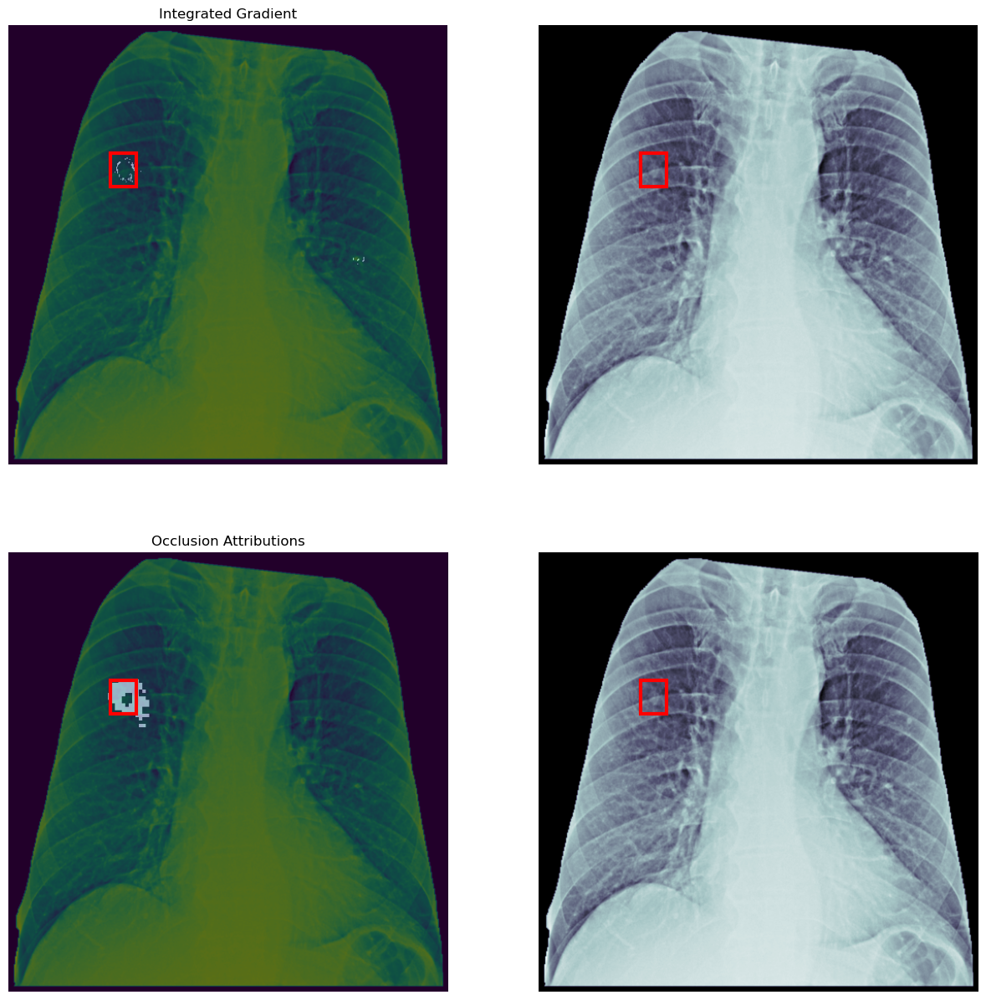

In [11]:
import matplotlib.patches as patches
# Create figure and axes
fig, ax = plt.subplots(2,2,figsize=(15, 15))
# Display the image
ax[0][0].imshow(pos_inputs[0][0].cpu())
ax[0][0].set_title('Integrated Gradient')
ax[0][0].imshow(cv2.threshold(base_full_cv2_int_attr,
                           base_full_cv2_int_attr.max()*0.25,
                           base_full_cv2_int_attr.max(),
                           cv2.THRESH_BINARY)[1],           
             cmap='binary_r', alpha=0.5)
# ax[0].imshow(cv2_int_attr, cmap='binary', alpha=0.5)
# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',                         
                         facecolor='none',lw=3)
# Add the patch to the Axes
ax[0][0].add_patch(rect)
# Display the image
ax[0][1].imshow(pos_inputs[0][0].cpu(),cmap="bone")
# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[0][1].add_patch(rect)
ax[0][0].axis("off")
ax[0][1].axis("off")

# Display the image
ax[1][0].imshow(pos_inputs[0][0].cpu())
ax[1][0].set_title('Occlusion Attributions')
ax[1][0].imshow(cv2.threshold(base_full_cv2_occ_attr,
                           base_full_cv2_occ_attr.max()*0.25,
                           base_full_cv2_occ_attr.max(),
                           cv2.THRESH_BINARY)[1], 
          cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[1][0].add_patch(rect)

# Display the image
ax[1][1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1][1].add_patch(rect)
ax[1][0].axis("off")
ax[1][1].axis("off")


plt.show()

##### Grey Full

In [12]:
model=grey_full_model.to(device)
int_model = grey_full_int_model
occ_model = grey_full_occ_model

int_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(int_model, pos_inputs[0], 1, single=False, window=8)
occ_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(occ_model, pos_inputs[0], 1, single=False, window=8)
model = model.to("cpu")
grey_full_cv2_occ_attr = cv2.cvtColor(occ_attrs[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)
grey_full_cv2_int_attr = int_attrs[0][0].unsqueeze(2).cpu().numpy()

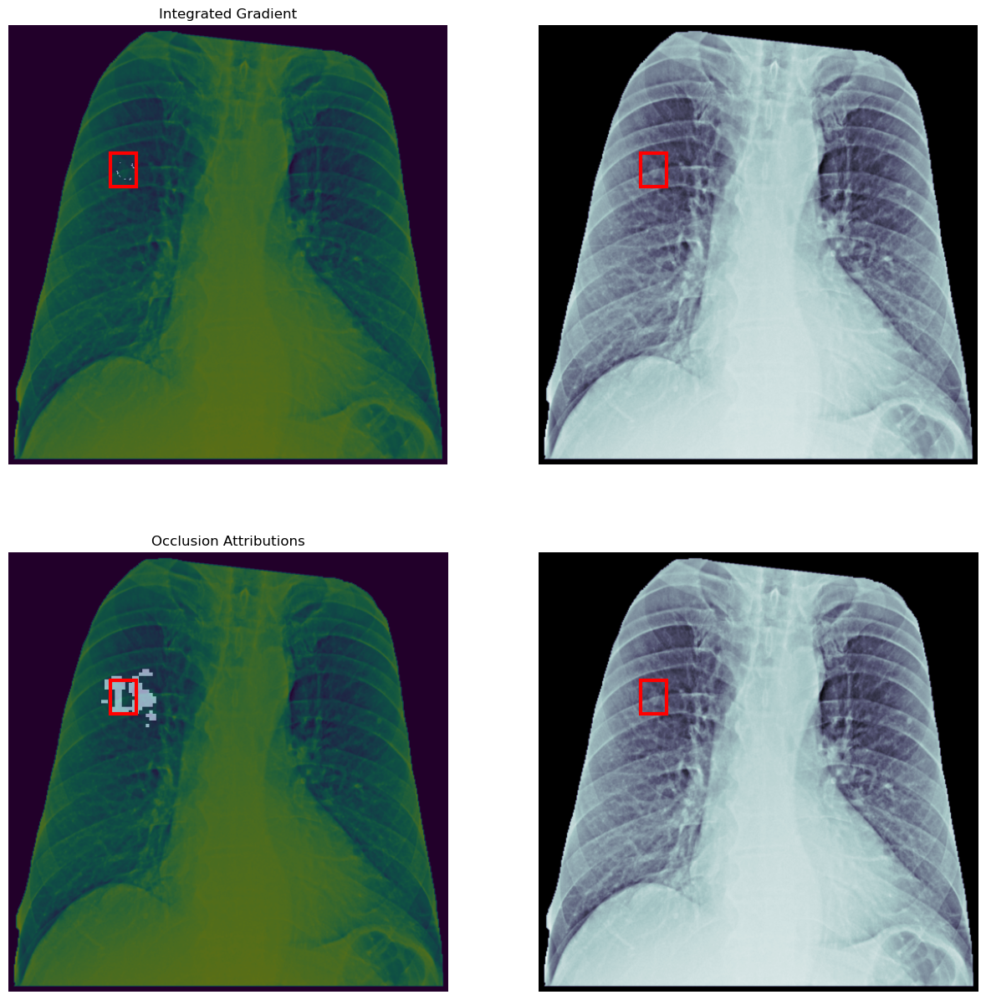

In [13]:
import matplotlib.patches as patches
# Create figure and axes
fig, ax = plt.subplots(2,2,figsize=(15, 15))
# Display the image
ax[0][0].imshow(pos_inputs[0][0].cpu())
ax[0][0].set_title('Integrated Gradient')
ax[0][0].imshow(cv2.threshold(grey_full_cv2_int_attr,
                           grey_full_cv2_int_attr.max()*0.25,
                           grey_full_cv2_int_attr.max(),
                           cv2.THRESH_BINARY)[1],           
             cmap='binary_r', alpha=0.5)
# ax[0].imshow(cv2_int_attr, cmap='binary', alpha=0.5)
# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',                         
                         facecolor='none',lw=3)
# Add the patch to the Axes
ax[0][0].add_patch(rect)
# Display the image
ax[0][1].imshow(pos_inputs[0][0].cpu(),cmap="bone")
# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[0][1].add_patch(rect)
ax[0][0].axis("off")
ax[0][1].axis("off")

# Display the image
ax[1][0].imshow(pos_inputs[0][0].cpu())
ax[1][0].set_title('Occlusion Attributions')
ax[1][0].imshow(cv2.threshold(grey_full_cv2_occ_attr,
                           grey_full_cv2_occ_attr.max()*0.25,
                           grey_full_cv2_occ_attr.max(),
                           cv2.THRESH_BINARY)[1], 
          cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[1][0].add_patch(rect)

# Display the image
ax[1][1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1][1].add_patch(rect)
ax[1][0].axis("off")
ax[1][1].axis("off")


plt.show()

#### Set 2

In [15]:
i=0
for data in cxr_test:
    pos_inputs, pos_labels = data[0],data[1]
    pos_paths = np.array(data[2])
    i+= 1
    if pos_labels.any() == 1:
        if not i<=181:
            break
pos_inputs = pos_inputs.to(device)
pos_labels = pos_labels.to(device)
pos_curr_bbox = helpers.bboxes.resize_bboxes([bbox_df[pos_paths[0].split("/")[-1].split("_")[0]]],224,512)[0]

# init int grad model
model=model.to(device)
int_attrs2 = helpers.explainability.get_occ_int_grad_for_single_tensor(int_model, pos_inputs[0], 1, single=False, window=8)
occ_attrs2 = helpers.explainability.get_occ_int_grad_for_single_tensor(occ_model, pos_inputs[0], 1, single=False, window=8)
model = model.to("cpu")
cv2_occ_attr2 = cv2.cvtColor(occ_attrs2[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)
cv2_int_attr2 = int_attrs2[0][0].unsqueeze(2).cpu().numpy()


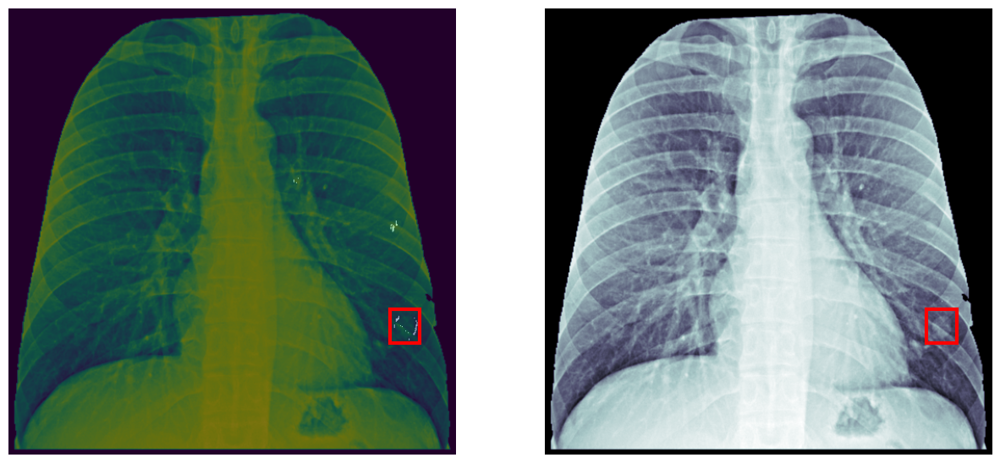

In [16]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu())

ax[0].imshow(cv2.threshold(cv2_int_attr2,cv2_int_attr2.max()*0.25,cv2_int_attr2.max(),cv2.THRESH_BINARY)[1], 
          cmap='binary_r', alpha=0.5)

# ax[0].imshow(cv2_int_attr, cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[0].add_patch(rect)

# Display the image
ax[1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1].add_patch(rect)

ax[0].axis("off")
ax[1].axis("off")
# plt.title("Integrated  Gradient")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


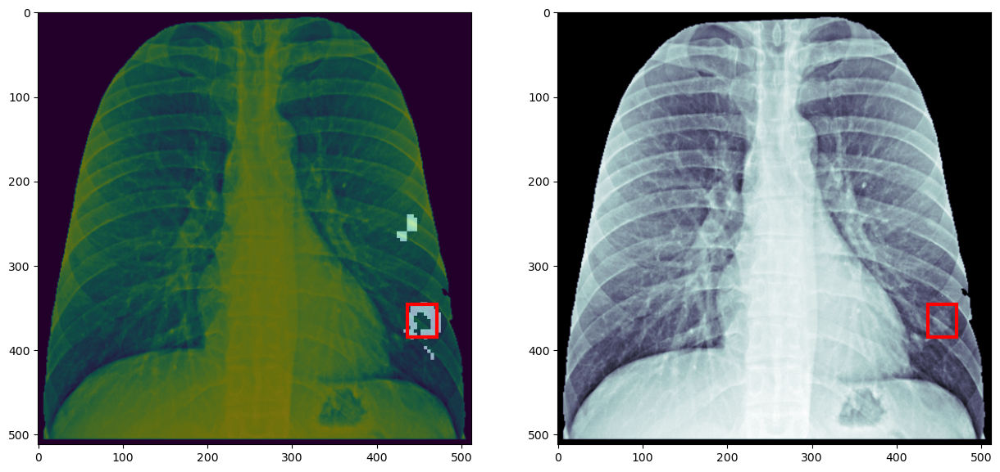

In [17]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu())

ax[0].imshow(cv2.threshold(cv2_occ_attr2,cv2_occ_attr2.max()*0.25,cv2_occ_attr2.max(),cv2.THRESH_BINARY)[1], 
          cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[0].add_patch(rect)

# Display the image
ax[1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1].add_patch(rect)
plt.show()

### Set 3

In [58]:
i

182

In [60]:
i=0
for data in cxr_test:
    pos_inputs, pos_labels = data[0],data[1]
    pos_paths = np.array(data[2])
    i+= 1
    if pos_labels.any() == 1:
        if not i<=182:
            break
pos_inputs = pos_inputs.to(device)
pos_labels = pos_labels.to(device)
pos_curr_bbox = helpers.bboxes.resize_bboxes([bbox_df[pos_paths[0].split("/")[-1].split("_")[0]]],224,512)[0]

# init int grad model
model=model.to(device)
int_model = helpers.explainability.make_int_grad_model(model)

int_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(
        int_model,
        pos_inputs[0],
        1,
        single=False,
        window=8
    )

# init occlusion model
occ_model = helpers.explainability.make_occ_int_grad_model(model)

occ_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(
        occ_model,
        pos_inputs[0],
        1,
        single=False,
        window=8
    )
model = model.to("cpu")

cv2_occ_attr = cv2.cvtColor(occ_attrs[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)

cv2_int_attr = int_attrs[0][0].unsqueeze(2).cpu().numpy()

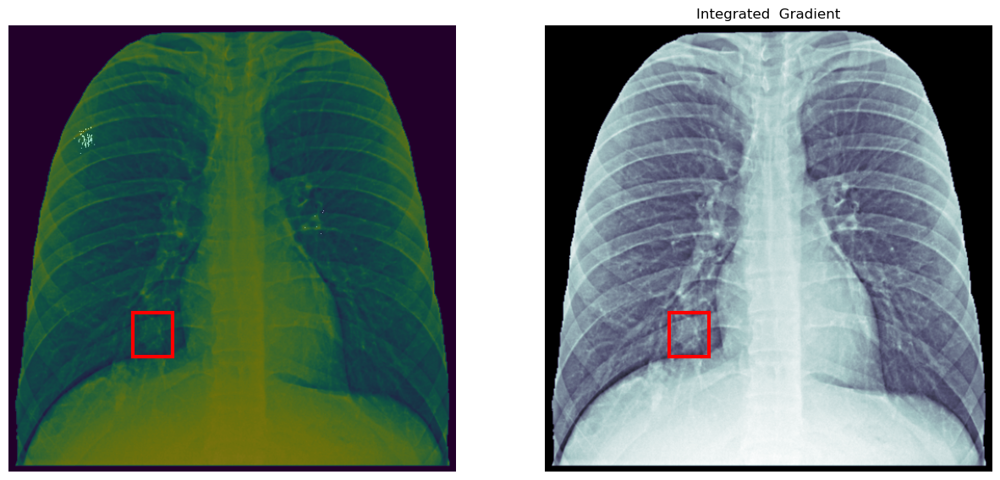

In [61]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu())

ax[0].imshow(cv2.threshold(cv2_int_attr,cv2_int_attr.max()*0.25,cv2_int_attr.max(),cv2.THRESH_BINARY)[1], 
          cmap='binary_r', alpha=0.5)

# ax[0].imshow(cv2_int_attr, cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[0].add_patch(rect)

# Display the image
ax[1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1].add_patch(rect)

ax[0].axis("off")
ax[1].axis("off")
plt.title("Integrated  Gradient")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


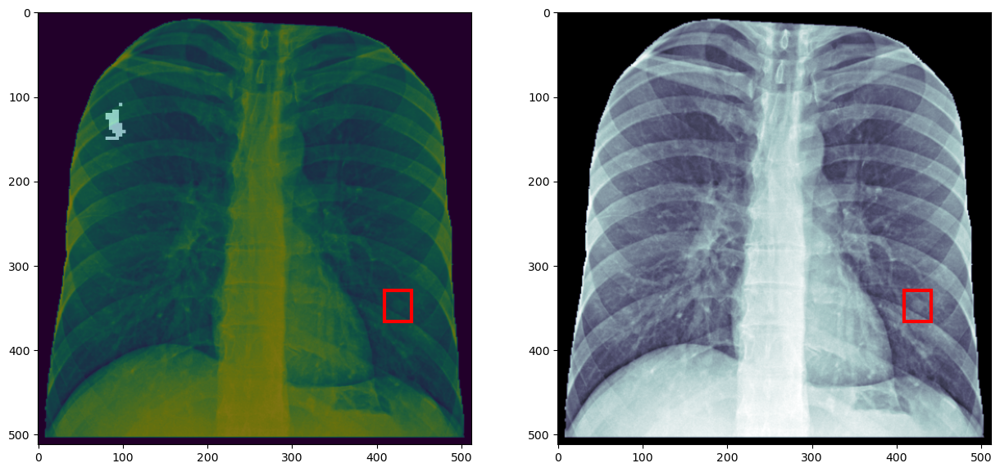

In [64]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu())

ax[0].imshow(cv2.threshold(cv2_occ_attr,cv2_occ_attr.max()*0.25,cv2_occ_attr.max(),cv2.THRESH_BINARY)[1], 
          cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[0].add_patch(rect)

# Display the image
ax[1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1].add_patch(rect)
plt.show()

### Set 4  

In [65]:
i=0
for data in cxr_test:
    pos_inputs, pos_labels = data[0],data[1]
    pos_paths = np.array(data[2])
    i+= 1
    if pos_labels.any() == 1:
        if not i<=183:
            break
pos_inputs = pos_inputs.to(device)
pos_labels = pos_labels.to(device)
pos_curr_bbox = helpers.bboxes.resize_bboxes([bbox_df[pos_paths[0].split("/")[-1].split("_")[0]]],224,512)[0]

# init int grad model
model=model.to(device)
int_model = helpers.explainability.make_int_grad_model(model)

int_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(
        int_model,
        pos_inputs[0],
        1,
        single=False,
        window=8
    )

# init occlusion model
occ_model = helpers.explainability.make_occ_int_grad_model(model)

occ_attrs = helpers.explainability.get_occ_int_grad_for_single_tensor(
        occ_model,
        pos_inputs[0],
        1,
        single=False,
        window=8
    )
model = model.to("cpu")


cv2_occ_attr = cv2.cvtColor(occ_attrs[0][0].unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)

cv2_int_attr = int_attrs[0][0].unsqueeze(2).cpu().numpy()

In [189]:
cv2_base_image = cv2.cvtColor(pos_inputs[0][0].cpu().unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)

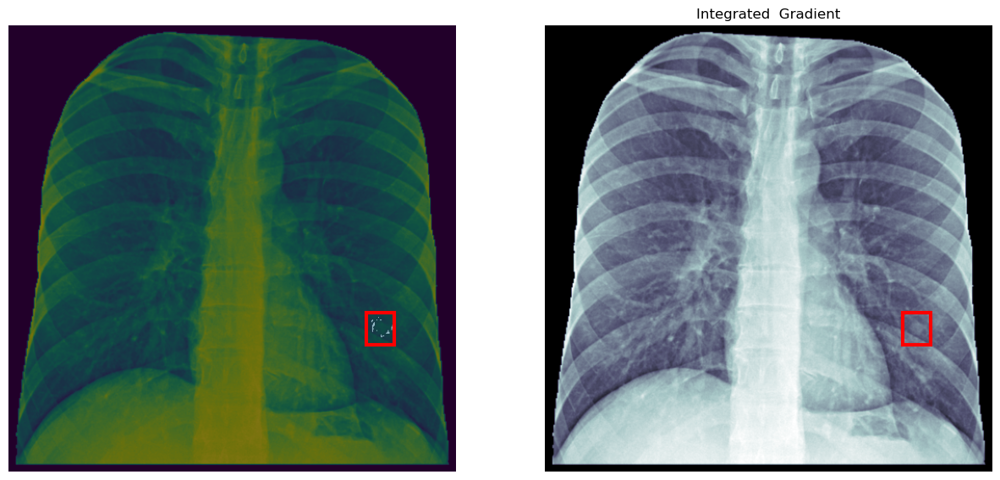

In [66]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu())

ax[0].imshow(cv2.threshold(cv2_int_attr,cv2_int_attr.max()*0.25,cv2_int_attr.max(),cv2.THRESH_BINARY)[1], 
          cmap='binary_r', alpha=0.5)

# ax[0].imshow(cv2_int_attr, cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[0].add_patch(rect)

# Display the image
ax[1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1].add_patch(rect)

ax[0].axis("off")
ax[1].axis("off")
plt.title("Integrated  Gradient")
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


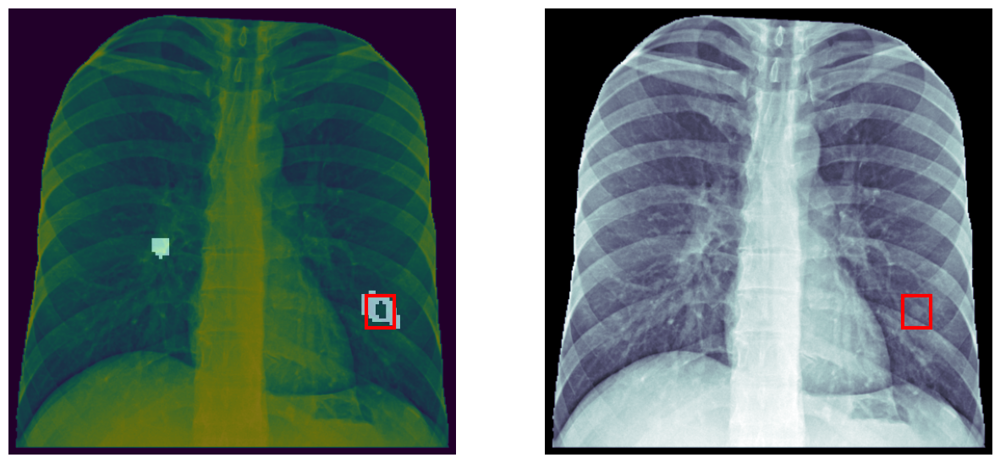

In [68]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu())

ax[0].imshow(cv2.threshold(cv2_occ_attr,cv2_occ_attr.max()*0.25,cv2_occ_attr.max(),cv2.THRESH_BINARY)[1], 
          cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red',
                         facecolor='none',lw=3)

# Add the patch to the Axes
ax[0].add_patch(rect)

# Display the image
ax[1].imshow(pos_inputs[0][0].cpu(),cmap="bone")

# ax[1].imshow(cv.threshold(cv2_attr,cv2_attr.max()*0.25,cv2_attr.max(),cv.THRESH_BINARY)[1], cmap='binary', alpha=0.5)

# Create a Rectangle patch
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=3)
# Add the patch to the Axes
ax[1].add_patch(rect)
ax[0].axis("off")
ax[1].axis("off")
plt.show()

## Mask to BBoxes 

#### Generate and Threshold Attributions

In [22]:
# base
base_full_thresh_int_attr = cv2.threshold(base_full_cv2_int_attr,
                                base_full_cv2_int_attr.max()*0.15, #ignore <25% activation
                                base_full_cv2_int_attr.max(),
                                cv2.THRESH_BINARY)[1]
non_zero_base_full_int_attr  = cv2.threshold(base_full_cv2_int_attr,
                                0,
                                base_full_cv2_int_attr.max(),
                                cv2.THRESH_TOZERO )[1]

base_full_conv_int_attr = (base_full_thresh_int_attr*8).astype(np.uint8)

# grey
grey_full_thresh_int_attr = cv2.threshold(grey_full_cv2_int_attr,
                                grey_full_cv2_int_attr.max()*0.15, #ignore <25% activation
                                grey_full_cv2_int_attr.max(),
                                cv2.THRESH_BINARY)[1]
non_zero_grey_full_int_attr  = cv2.threshold(grey_full_cv2_int_attr,
                                0, #ignore <25% activation
                                grey_full_cv2_int_attr.max(),
                                cv2.THRESH_TOZERO )[1]

grey_full_conv_int_attr = (grey_full_thresh_int_attr*8).astype(np.uint8)

In [21]:
# base
base_full_thresh_occ_attr = cv2.threshold(base_full_cv2_occ_attr,
                                base_full_cv2_occ_attr.max()*0.15, #ignore <25% activation
                                base_full_cv2_occ_attr.max(),
                                cv2.THRESH_BINARY)[1]
non_zero_base_full_occ_attr  = cv2.threshold(base_full_cv2_occ_attr,
                                0,
                                base_full_cv2_occ_attr.max(),
                                cv2.THRESH_TOZERO )[1]

base_full_conv_occ_attr = (base_full_thresh_occ_attr*8).astype(np.uint8)

# grey
grey_full_thresh_occ_attr = cv2.threshold(grey_full_cv2_occ_attr,
                                grey_full_cv2_occ_attr.max()*0.15, #ignore <25% activation
                                grey_full_cv2_occ_attr.max(),
                                cv2.THRESH_BINARY)[1]
non_zero_grey_full_occ_attr  = cv2.threshold(grey_full_cv2_occ_attr,
                                0, 
                                grey_full_cv2_occ_attr.max(),
                                cv2.THRESH_TOZERO)[1]

grey_full_conv_occ_attr = (grey_full_thresh_occ_attr*8).astype(np.uint8)

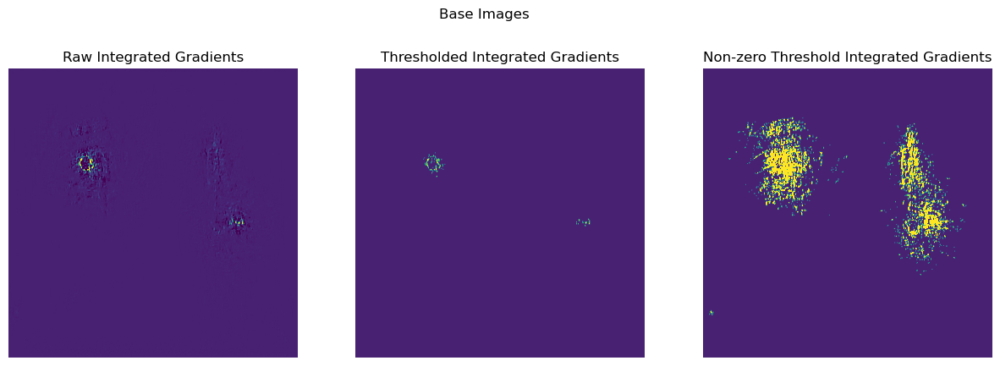

In [23]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,3,figsize=(15, 5))

# Display the image
ax[0].imshow(base_full_cv2_int_attr*20, vmin=-0.1, vmax=1)#,cmap="magma")
ax[1].imshow(base_full_conv_int_attr, vmin=-0.1, vmax=1)#,cmap="magma")
ax[2].imshow(convert_to_uint8(non_zero_base_full_int_attr) , vmin=-0.1, vmax=1)#,cmap="magma")

ax[0].set_title('Raw Integrated Gradients')
ax[1].set_title('Thresholded Integrated Gradients')
ax[2].set_title('Non-zero Threshold Integrated Gradients')
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")
fig.suptitle("Base Images")

plt.show()

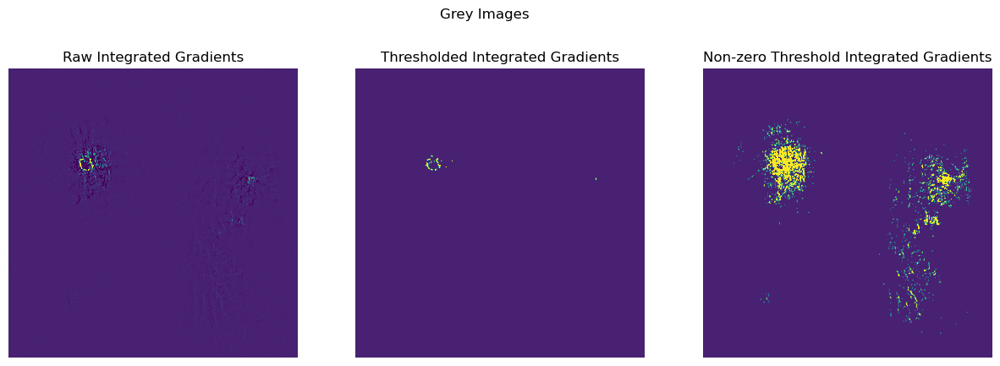

In [24]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,3,figsize=(15, 5))

# Display the image
ax[0].imshow(grey_full_cv2_int_attr*20, vmin=-0.1, vmax=1)#,cmap="magma")
ax[1].imshow(grey_full_conv_int_attr, vmin=-0.1, vmax=1)#,cmap="magma")
ax[2].imshow(convert_to_uint8(non_zero_grey_full_int_attr) , vmin=-0.1, vmax=1)#,cmap="magma")

ax[0].set_title('Raw Integrated Gradients')
ax[1].set_title('Thresholded Integrated Gradients')
ax[2].set_title('Non-zero Threshold Integrated Gradients')
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")
fig.suptitle("Grey Images")
plt.show()

In [25]:
cv2_base_image = cv2.cvtColor(pos_inputs[0][0].cpu().unsqueeze(2).cpu().numpy(), cv2.COLOR_RGB2BGR)

##### Box Generation with Connected Components

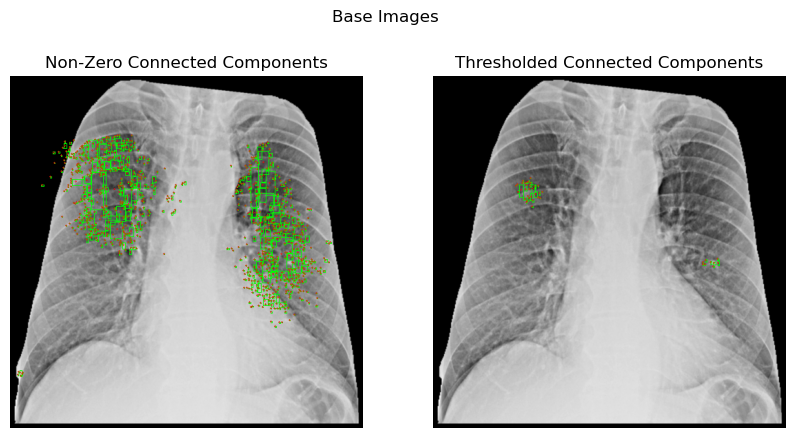

In [163]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(10, 5))

n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(non_zero_base_full_int_attr))
copy_img = convert_to_uint8(cv2_base_image.copy())
size_thresh = 1

size_thresh_idx = []
for i in range(1, n_labels): # start at 1 to ignore image centerpoint
    if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
        #print(stats[i, cv2.CC_STAT_AREA])
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
        cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
        size_thresh_idx.append(i)

# Display the image
ax[0].imshow(copy_img)#,cmap="magma")

n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(base_full_conv_int_attr))
copy_img = convert_to_uint8(cv2_base_image.copy())
size_thresh = 1

size_thresh_idx = []
for i in range(1, n_labels): # start at 1 to ignore image centerpoint
    if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
        #print(stats[i, cv2.CC_STAT_AREA])
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
        cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
        size_thresh_idx.append(i)
ax[1].imshow(copy_img)#,cmap="magma")

ax[0].set_title('Non-Zero Connected Components')
ax[1].set_title('Thresholded Connected Components')

ax[0].axis("off")
ax[1].axis("off")

fig.suptitle("Base Images")
plt.show()

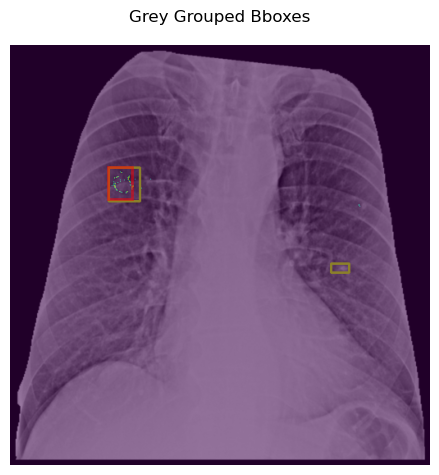

In [164]:
import numpy as np
from sklearn.cluster import DBSCAN

max_distance = 15
margin = 0

size_thresh_centroids = centroids[size_thresh_idx]
db = DBSCAN(eps=max_distance, min_samples=1).fit(size_thresh_centroids)
labels = db.labels_

binary_mask = grey_full_thresh_int_attr

# Calculate bounding boxes for each cluster
grouped_bboxes = []
unique_labels = np.unique(labels)

for label in unique_labels:
    cluster_points = size_thresh_centroids[labels == label]

    # Calculate the bounding box for the cluster
    x_min = np.min(cluster_points[:, 0])
    y_min = np.min(cluster_points[:, 1])
    x_max = np.max(cluster_points[:, 0])
    y_max = np.max(cluster_points[:, 1])

    # Apply margin to expand the bounding box
    x_min = max(0, x_min - margin)
    y_min = max(0, y_min - margin)
    x_max = min(binary_mask.shape[1] - 1, x_max + margin)
    y_max = min(binary_mask.shape[0] - 1, y_max + margin)

    grouped_bboxes.append((x_min, y_min, x_max, y_max))

copy_img = convert_to_uint8(cv2_base_image.copy())
# binary_mask = cv2.imread("your_mask.png", cv2.IMREAD_GRAYSCALE)


# Draw bounding boxes on the original image (or mask image)
for dbscan_bbox in grouped_bboxes:
    x_min, y_min, x_max, y_max = np.array(dbscan_bbox).astype(int)
    cv2.rectangle(copy_img, (x_min, y_min), (x_max, y_max), (212, 255, 0), 2)

# # Show the result
# cv2.imshow("Grouped Bounding Boxes", binary_mask)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(copy_img)

ax.imshow(binary_mask, alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")
plt.suptitle("Grey Grouped Bboxes")
plt.tight_layout()
plt.show()


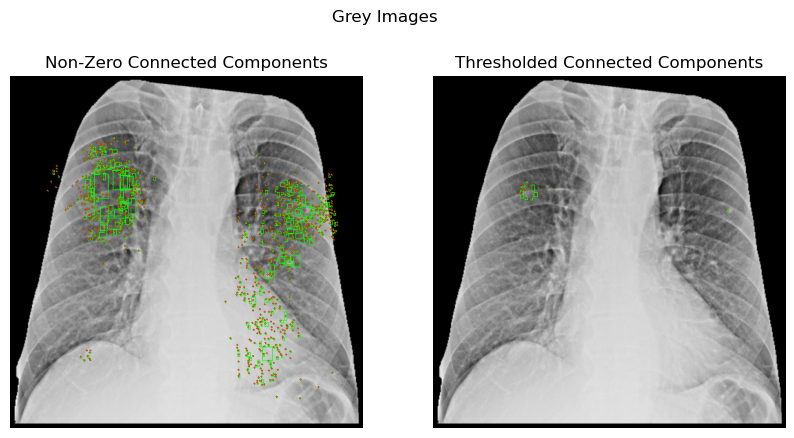

In [243]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(10, 5))

n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(non_zero_grey_full_int_attr))
copy_img = convert_to_uint8(cv2_base_image.copy())
size_thresh = 1

size_thresh_idx = []
for i in range(1, n_labels): # start at 1 to ignore image centerpoint
    if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
        #print(stats[i, cv2.CC_STAT_AREA])
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
        cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
        size_thresh_idx.append(i)

# Display the image
ax[0].imshow(copy_img)#,cmap="magma")

n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(grey_full_conv_int_attr))
copy_img = convert_to_uint8(cv2_base_image.copy())
size_thresh = 1

size_thresh_idx = []
for i in range(1, n_labels): # start at 1 to ignore image centerpoint
    if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
        #print(stats[i, cv2.CC_STAT_AREA])
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
        cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
        size_thresh_idx.append(i)
ax[1].imshow(copy_img)#,cmap="magma")

ax[0].set_title('Non-Zero Connected Components')
ax[1].set_title('Thresholded Connected Components')

ax[0].axis("off")
ax[1].axis("off")

fig.suptitle("Grey Images")
plt.show()

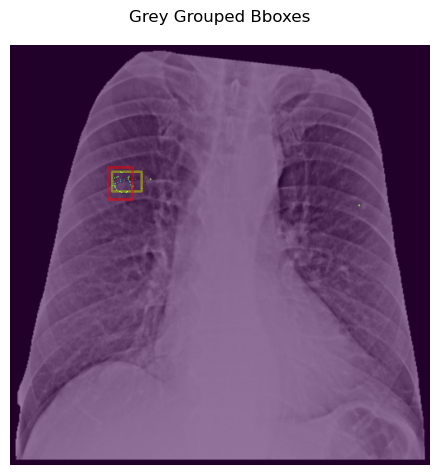

In [244]:
import numpy as np
from sklearn.cluster import DBSCAN

max_distance = 15
margin = 0

size_thresh_centroids = centroids[size_thresh_idx]
db = DBSCAN(eps=max_distance, min_samples=1).fit(size_thresh_centroids)
labels = db.labels_

binary_mask = grey_full_thresh_int_attr

# Calculate bounding boxes for each cluster
grouped_bboxes = []
unique_labels = np.unique(labels)

for label in unique_labels:
    cluster_points = size_thresh_centroids[labels == label]

    # Calculate the bounding box for the cluster
    x_min = np.min(cluster_points[:, 0])
    y_min = np.min(cluster_points[:, 1])
    x_max = np.max(cluster_points[:, 0])
    y_max = np.max(cluster_points[:, 1])

    # Apply margin to expand the bounding box
    x_min = max(0, x_min - margin)
    y_min = max(0, y_min - margin)
    x_max = min(binary_mask.shape[1] - 1, x_max + margin)
    y_max = min(binary_mask.shape[0] - 1, y_max + margin)

    grouped_bboxes.append((x_min, y_min, x_max, y_max))

copy_img = convert_to_uint8(cv2_base_image.copy())
# binary_mask = cv2.imread("your_mask.png", cv2.IMREAD_GRAYSCALE)


# Draw bounding boxes on the original image (or mask image)
for dbscan_bbox in grouped_bboxes:
    x_min, y_min, x_max, y_max = np.array(dbscan_bbox).astype(int)
    cv2.rectangle(copy_img, (x_min, y_min), (x_max, y_max), (212, 255, 0), 2)

# # Show the result
# cv2.imshow("Grouped Bounding Boxes", binary_mask)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(copy_img)

ax.imshow(binary_mask, alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")
plt.suptitle("Grey Grouped Bboxes")
plt.tight_layout()
plt.show()


In [167]:
def plt_area_thresheld_connected_components(mask, plot_image, size_thresh = 1):
    """Visualise the connected componenents and centroids"""
    # duplicate image to prevent overwriting base
    copy_img = convert_to_uint8(plot_image.copy())
    # generate cc
    n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(mask))
    
    for i in range(1, n_labels):
        if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
            x = stats[i, cv2.CC_STAT_LEFT]
            y = stats[i, cv2.CC_STAT_TOP]
            w = stats[i, cv2.CC_STAT_WIDTH]
            h = stats[i, cv2.CC_STAT_HEIGHT]
            # plot cc bbox
            cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
            # plot cc centroid
            cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
    plt.imshow(copy_img)
    plt.axis("off")

In [226]:
def get_area_thresheld_connected_components(mask, size_thresh = 1, img=None):
    """
    Returns connected components from mask.

    Args:
    - mask (): Single channel attributtion mask
    - size_thresh (int, optional): minimum area for connected component

    Returns:
    - df (DataFrame): ["centroid","xmin","xmax","ymin","ymax"]
    - centroids (2D Numpy array): array of [x,y] pairs
    
    """
    if mask.ndim == 3:
        mask = mask[:,:,0]
    df = pd.DataFrame(columns=["centroid","xmin","xmax","ymin","ymax"])
    n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(mask))
    if img is not None:
        copy_img = convert_to_uint8(img.copy())
    # save idx of valid components
    size_thresh_idx = []
    for i in range(1, n_labels):
        if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
            x = stats[i, cv2.CC_STAT_LEFT]
            y = stats[i, cv2.CC_STAT_TOP]
            w = stats[i, cv2.CC_STAT_WIDTH]
            h = stats[i, cv2.CC_STAT_HEIGHT]
            size_thresh_idx.append(i)
            # Add a new row using loc[]
            df.loc[len(df)] = [centroids[i], x, x+w, y, y+h]
            if img is not None:
                cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
                cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
    if img is not None:
        plt.imshow(copy_img)
        plt.axis("off")
        
    return df
    # return centroids[size_thresh_idx].astype(int)
    

In [229]:
def cc_bboxes_by_dbscan(centroids, max_distance=10, min_samples=1, margin=0, x_shape=512, y_shape=512):
    """Generate b"""
    db = DBSCAN(eps=max_distance, min_samples=1).fit(centroids)
    labels = db.labels_
    
    # Calculate bounding boxes for each cluster
    grouped_bboxes = []
    unique_labels = np.unique(labels)
    
    for label in unique_labels:
        cluster_points = centroids[labels == label]
        # Calculate the bounding box for the cluster
        x_min = np.min(cluster_points[:, 0])
        y_min = np.min(cluster_points[:, 1])
        x_max = np.max(cluster_points[:, 0])
        y_max = np.max(cluster_points[:, 1])
    
        # Apply margin to expand the bounding box
        x_min = max(0, x_min - margin)
        y_min = max(0, y_min - margin)
        x_max = min(x_shape - 1, x_max + margin)
        y_max = min(y_shape - 1, y_max + margin)

        if x_max-x_min > 0 and y_max-y_min > 0:
            grouped_bboxes.append((x_min, y_min, x_max, y_max))
    
    return grouped_bboxes

In [198]:
test_centroids = np.array(centr_df['centroid'].values.tolist())
# apply DBSCAN to centroids
test_db = DBSCAN(eps=10, min_samples=1).fit(test_centroids)
# get group labels from DBSCAN
test_labels = test_db.labels_

# Calculate bounding boxes for each cluster
test_grouped_bboxes = []
test_unique_labels = np.unique(test_labels)

In [238]:

def plt_area_thresheld_connected_components(mask, plot_image, size_thresh = 1):
    """Visualise the connected componenents and centroids"""
    # duplicate image to prevent overwriting base
    copy_img = convert_to_uint8(plot_image.copy())
    # generate cc
    n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(mask))
    
    for i in range(1, n_labels):
        if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
            x = stats[i, cv2.CC_STAT_LEFT]
            y = stats[i, cv2.CC_STAT_TOP]
            w = stats[i, cv2.CC_STAT_WIDTH]
            h = stats[i, cv2.CC_STAT_HEIGHT]
            # plot cc bbox
            cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
            # plot cc centroid
            cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
    plt.imshow(copy_img)
    plt.axis("off")

def df_cc_bboxes_by_dbscan(df, max_distance=10, min_samples=1, margin=0, x_shape=512, y_shape=512, thresh_area = 4):
    """Generate b"""
    # get centroids from df and convert into correct format
    centroids = np.array(df['centroid'].values.tolist())
    # apply DBSCAN to centroids
    db = DBSCAN(eps=max_distance, min_samples=min_samples).fit(centroids)
    # get group labels from DBSCAN
    labels = db.labels_
    
    # Calculate bounding boxes for each cluster
    grouped_bboxes = []
    unique_labels = np.unique(labels)
    
    for label in unique_labels:
        # cluster_points = centroids[labels == label]
        # print(f"cluster_points: {cluster_points}" )
        # # Calculate the bounding box for the cluster
        # x_min = np.min(cluster_points[:, 0])
        # y_min = np.min(cluster_points[:, 1])
        # x_max = np.max(cluster_points[:, 0])
        # y_max = np.max(cluster_points[:, 1])
        
        cluster_df = df[labels==label]
        x_min = cluster_df.xmin.min()
        x_max = cluster_df.xmax.max()
        y_min = cluster_df.ymin.min()
        y_max = cluster_df.ymax.max()
        
        # Apply margin to expand the bounding box
        x_min = max(0, x_min - margin)
        y_min = max(0, y_min - margin)
        x_max = min(x_shape - 1, x_max + margin)
        y_max = min(y_shape - 1, y_max + margin)

        # if x_max-x_min > 0 and y_max-y_min > 0:
        #     grouped_bboxes.append((x_min, y_min, x_max, y_max))
        if x_max-x_min > 0 and y_max-y_min > 0 and ((x_max-x_min)*(y_max-y_min)>=thresh_area):
            # grouped_bboxes.append((x_min, x_max, y_min, y_max))
            grouped_bboxes.append((x_min, y_min, x_max, y_max))
    
    
    return grouped_bboxes

In [54]:
def draw_bboxes(bboxes, img):
    for bbox in bboxes:
        x_min, y_min, x_max, y_max = np.array(bbox).astype(int)
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    return img

#### Region Proposal Method

Text(0.5, 0.98, 'Integrated Gradients')

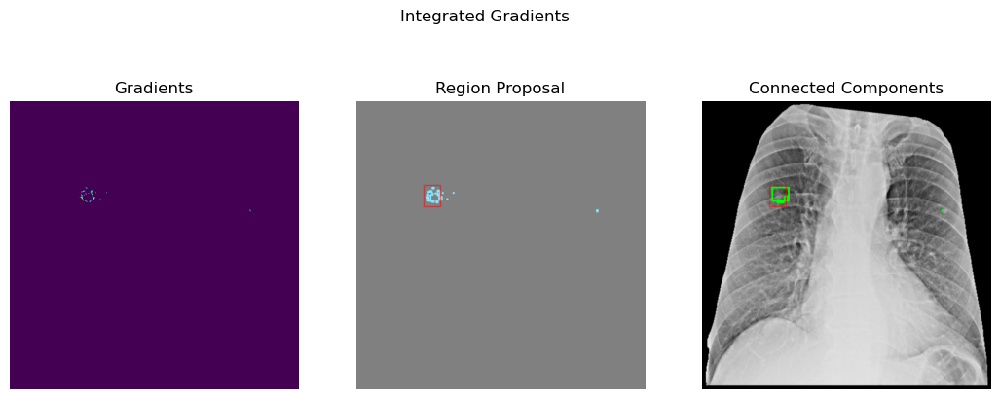

In [247]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = cv2.merge((grey_full_conv_int_attr.copy(),grey_full_conv_int_attr.copy(),grey_full_conv_int_attr.copy()))
img = convert_to_uint8(plt_img)
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 170
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)

fig, ax = plt.subplots(1,3,figsize=(13,5))
ax[0].imshow(plt_img[:,:,0])
ax[0].axis('off')
ax[0].set_title("Gradients")

ax[1].imshow(mask_0,alpha=0.5)

ax[1].axis('off')
ax[1].set_title("Region Proposal")
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

centr_df = get_area_thresheld_connected_components(grey_full_conv_int_attr)
centr_bboxes = df_cc_bboxes_by_dbscan(centr_df,8)
copy_img = draw_bboxes(centr_bboxes,
                       img=convert_to_uint8(cv2_base_image.copy()))
ax[2].imshow(copy_img)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[2].add_patch(rect)
ax[2].axis('off')
ax[2].set_title("Connected Components")
plt.suptitle("Integrated Gradients")

Text(0.5, 1.0, 'Connected Components')

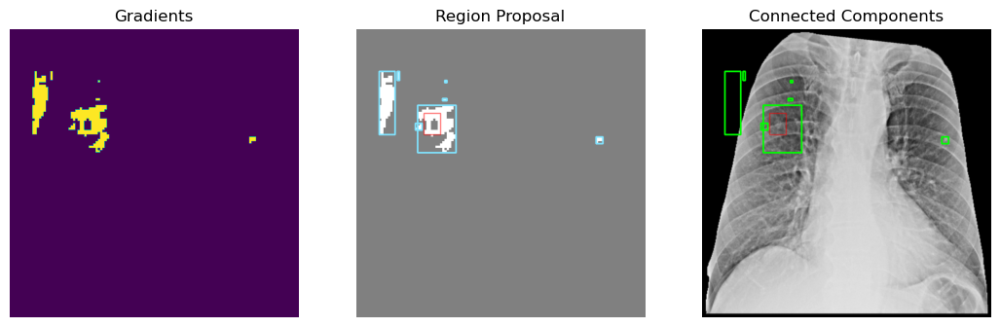

In [248]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = grey_full_conv_occ_attr.copy()
img = convert_to_uint8(plt_img)
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 170
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)

fig, ax = plt.subplots(1,3,figsize=(13,5))
ax[0].imshow(plt_img[:,:,0])
ax[0].axis('off')
ax[0].set_title("Gradients")

# ax[1].imshow(convert_to_uint8(cv2_base_image.copy()))
ax[1].imshow(mask_0,alpha=0.5)

ax[1].axis('off')
ax[1].set_title("Region Proposal")
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

centr_df = get_area_thresheld_connected_components(grey_full_conv_occ_attr)
centr_bboxes = df_cc_bboxes_by_dbscan(centr_df,8)
copy_img = draw_bboxes(centr_bboxes,
                       img=convert_to_uint8(cv2_base_image.copy()))
ax[2].imshow(copy_img)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[2].add_patch(rect)
ax[2].axis('off')
ax[2].set_title("Connected Components")


In [ ]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = grey_full_cv2_occ_attr.copy()
img = convert_to_uint8(plt_img)
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 170
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        print('Found bbox', prop.bbox)
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)
fig, ax = plt.subplots(1,2)
ax[0].imshow(plt_img)
ax[0].axis('off')

ax[1].imshow(mask_0)
ax[1].axis('off')
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Found bbox (44, 36, 216, 80)
Found bbox (88, 156, 96, 172)
Found bbox (120, 108, 232, 176)
Found bbox (168, 100, 180, 116)
Found bbox (192, 424, 208, 436)
Found bbox (216, 432, 220, 440)
Found bbox (232, 128, 244, 136)


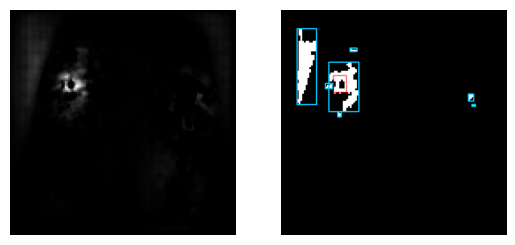

In [97]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = grey_full_cv2_occ_attr.copy()
img = convert_to_uint8(plt_img)
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 170
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        print('Found bbox', prop.bbox)
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)
fig, ax = plt.subplots(1,2)
ax[0].imshow(plt_img)
ax[0].axis('off')

ax[1].imshow(mask_0)
ax[1].axis('off')
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Found bbox (44, 36, 216, 80)
Found bbox (88, 156, 96, 172)
Found bbox (120, 108, 232, 176)
Found bbox (168, 100, 180, 116)
Found bbox (192, 424, 208, 436)
Found bbox (216, 432, 220, 440)
Found bbox (232, 128, 244, 136)


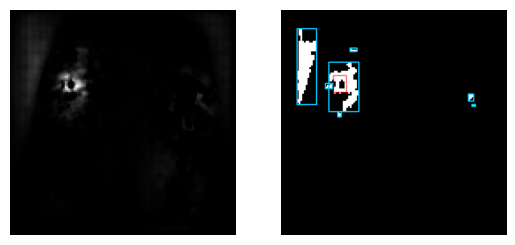

In [55]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = grey_full_cv2_occ_attr.copy()
img = convert_to_uint8(plt_img)
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 170
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        print('Found bbox', prop.bbox)
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)
fig, ax = plt.subplots(1,2)
ax[0].imshow(plt_img)
ax[0].axis('off')

ax[1].imshow(mask_0)
ax[1].axis('off')
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

Found bbox (44, 40, 64, 48)
Found bbox (68, 36, 216, 80)
Found bbox (88, 156, 96, 172)
Found bbox (120, 108, 232, 176)
Found bbox (168, 100, 180, 116)
Found bbox (192, 424, 208, 436)
Found bbox (216, 432, 220, 440)
Found bbox (236, 128, 244, 136)


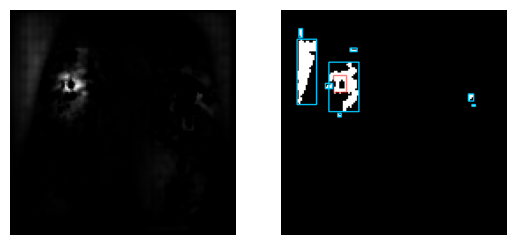

In [33]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = non_zero_grey_full_occ_attr.copy()
img = convert_to_uint8(plt_img)
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 30
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        print('Found bbox', prop.bbox)
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)
fig, ax = plt.subplots(1,2)
ax[0].imshow(plt_img)
ax[0].axis('off')
ax[1].imshow(mask_0)
ax[1].axis('off')
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

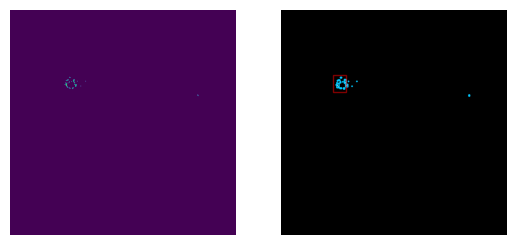

In [35]:
from skimage.measure import label, regionprops
# from skimage.morphology import label
plt_img = grey_full_conv_int_attr.copy()

img = convert_to_uint8(plt_img)
if img.ndim != 3:
    img = cv2.merge((img,img,img))
# img = convert_to_uint8(grey_full_cv2_occ_attr.copy().transpose(2,0,1)[0])

thresh = 50
mask_0 = cv2.threshold(img, thresh, 255, cv2.THRESH_BINARY)[1]
mask_1 = mask_0[:,:,0]
lbl_0 = label(mask_1) 
props = regionprops(lbl_0)
for prop in props:
    if prop.bbox[1]==0 and prop.bbox[0]==0:
        pass
    else:
        cv2.rectangle(mask_0, (prop.bbox[1], prop.bbox[0]), (prop.bbox[3], prop.bbox[2]), (0, 200, 255), 2)
fig, ax = plt.subplots(1,2)
ax[0].imshow(plt_img)
ax[0].axis('off')
ax[1].imshow(mask_0)
ax[1].axis('off')
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=1)

# Add the patch to the Axes
ax[1].add_patch(rect)

In [36]:
test_att= non_zero_base_full_int_attr

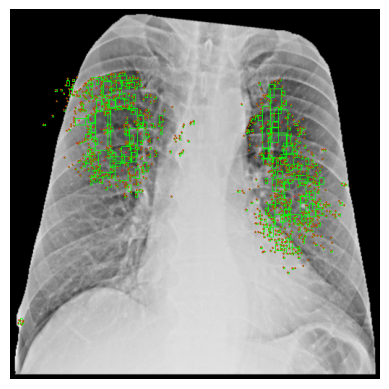

In [37]:
test = get_area_thresheld_connected_components(
    mask= test_att, 
    size_thresh=1,
    img=cv2_base_image)

In [38]:
test_df = get_area_thresheld_connected_components(test_att)

(-0.5, 511.5, 511.5, -0.5)

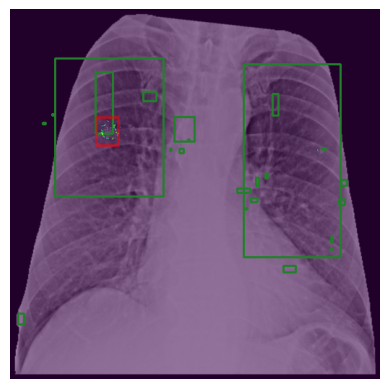

In [44]:
testimg = draw_bboxes(df_cc_bboxes_by_dbscan(test_df),
                       img=convert_to_uint8(cv2_base_image.copy()))
fig, ax = plt.subplots()
ax.imshow(testimg)
ax.imshow(grey_full_conv_int_attr, alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")

(-0.5, 511.5, 511.5, -0.5)

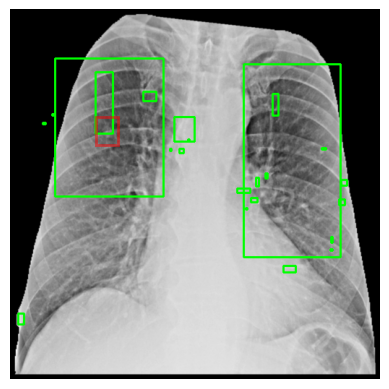

In [45]:
test_centroids = np.array(test_df['centroid'].values.tolist())

test_db = DBSCAN(eps=10, min_samples=1).fit(test_centroids)

test_labels = test_db.labels_

for test_label in np.unique(test_labels):
    test_cluster_points = test_df[test_labels == test_label]
df_cc_bboxes_by_dbscan
testimg = draw_bboxes(df_cc_bboxes_by_dbscan(test_df),
                       img=testimg)
fig, ax = plt.subplots()
ax.imshow(testimg)
# ax.imshow(grey_full_conv_int_attr, alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")

In [179]:
test_centroids = np.array(test_df['centroid'].values.tolist())
# apply DBSCAN to centroids
test_db = DBSCAN(eps=max_distance, min_samples=1).fit(test_centroids)

In [180]:
test_centroids

array([[141.        , 149.        ],
       [130.        , 153.        ],
       [138.25      , 154.25      ],
       [136.        , 155.5       ],
       [141.25      , 156.25      ],
       [129.        , 156.        ],
       [133.        , 156.        ],
       [122.        , 158.        ],
       [127.5       , 166.36111111],
       [135.        , 159.5       ],
       [140.        , 160.        ],
       [144.84615385, 164.5       ],
       [147.5       , 161.5       ],
       [120.        , 160.        ],
       [152.        , 160.5       ],
       [134.4       , 165.        ],
       [139.        , 165.        ],
       [123.5       , 169.        ],
       [148.85714286, 172.85714286],
       [154.        , 171.        ],
       [158.        , 169.        ],
       [142.35294118, 176.05882353],
       [137.        , 175.        ],
       [152.        , 177.        ],
       [133.44444444, 179.        ],
       [139.6       , 178.8       ],
       [155.        , 178.        ],
 

In [177]:
df_cc_bboxes_by_dbscan(test_df)

[]

(-0.5, 511.5, 511.5, -0.5)

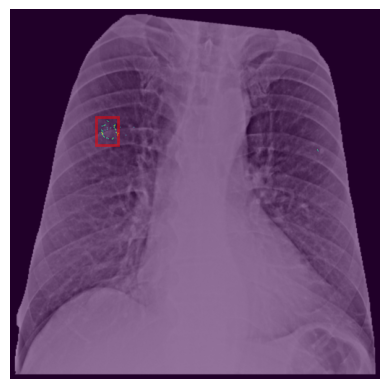

In [174]:
testimg = draw_bboxes(df_cc_bboxes_by_dbscan(test_df),
                       img=convert_to_uint8(cv2_base_image.copy()))
fig, ax = plt.subplots()
ax.imshow(testimg)
ax.imshow(grey_full_conv_int_attr, alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")

Text(0.5, 0.98, 'Non-Zero Threshold')

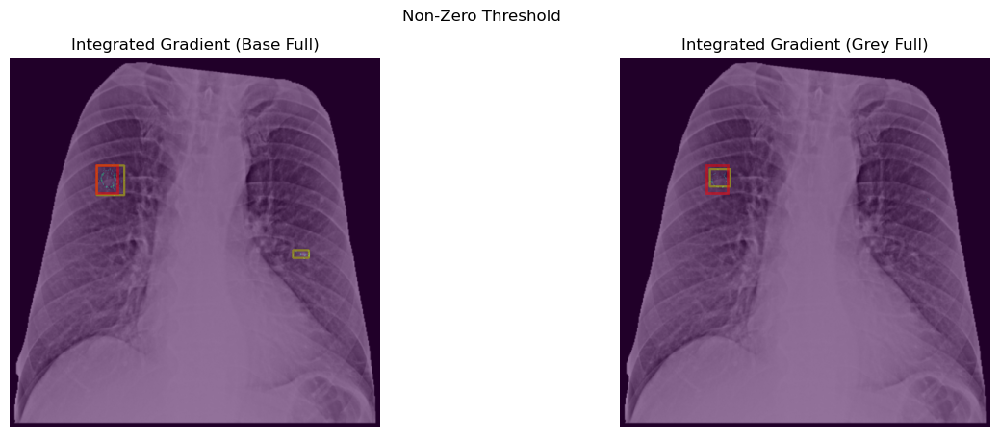

In [81]:
fig, ax = plt.subplots(1,2,figsize=(15, 5))

# generate int grad bboxes
non_zero_bboxes = cc_bboxes_by_dbscan(get_area_thresheld_connected_components(non_zero_base_full_int_attr))
# make base image
plt_img = convert_to_uint8(cv2_base_image.copy())
# draw bboxes
draw_bboxes(non_zero_bboxes, plt_img)
# Display the image
ax[0].imshow(plt_img)
# show IGs
ax[0].imshow(non_zero_base_full_int_attr, alpha=0.5)
# draw bbox
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax[0].add_patch(rect)
ax[0].axis("off")
ax[0].set_title('Integrated Gradient (Base Full)')


# generate int grad bboxes
non_zero_bboxes = cc_bboxes_by_dbscan(get_area_thresheld_connected_components(non_zero_grey_full_int_attr))
# make base image
plt_img = convert_to_uint8(cv2_base_image.copy())
# draw bboxes
draw_bboxes(non_zero_bboxes, plt_img)
# Display the image
ax[1].imshow(plt_img)
# show IGs
ax[1].imshow(non_zero_grey_full_int_attr, alpha=0.5)
# draw bbox
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax[1].add_patch(rect)
ax[1].axis("off")
ax[1].set_title('Integrated Gradient (Grey Full)')
fig.suptitle('Non-Zero Threshold')

Text(0.5, 0.98, '75% Threshold')

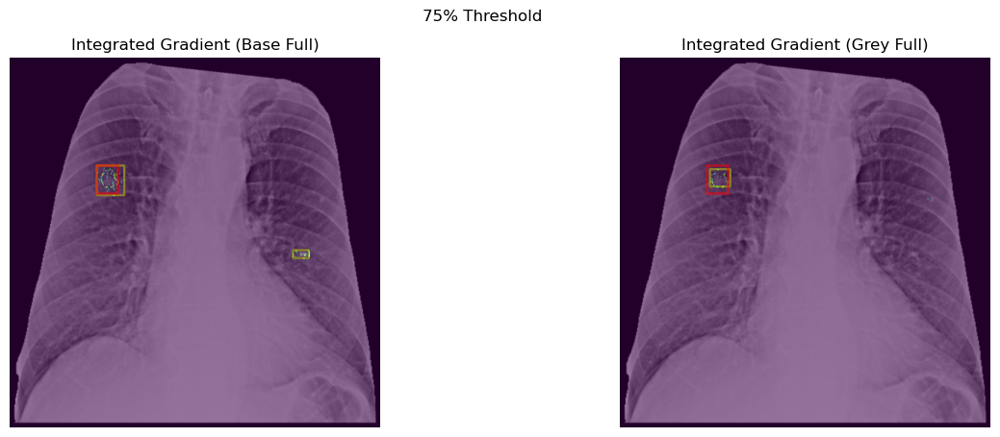

In [82]:
fig, ax = plt.subplots(1,2,figsize=(15, 5))

# generate int grad bboxes
non_zero_bboxes = cc_bboxes_by_dbscan(get_area_thresheld_connected_components(base_full_conv_int_attr))
# make base image
plt_img = convert_to_uint8(cv2_base_image.copy())
# draw bboxes
draw_bboxes(non_zero_bboxes, plt_img)
# Display the image
ax[0].imshow(plt_img)
# show IGs
ax[0].imshow(base_full_conv_int_attr, alpha=0.5)
# draw bbox
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax[0].add_patch(rect)
ax[0].axis("off")
ax[0].set_title('Integrated Gradient (Base Full)')


# generate int grad bboxes
non_zero_bboxes = cc_bboxes_by_dbscan(get_area_thresheld_connected_components(grey_full_conv_int_attr))
# make base image
plt_img = convert_to_uint8(cv2_base_image.copy())
# draw bboxes
draw_bboxes(non_zero_bboxes, plt_img)
# Display the image
ax[1].imshow(plt_img)
# show IGs
ax[1].imshow(grey_full_conv_int_attr, alpha=0.5)
# draw bbox
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax[1].add_patch(rect)
ax[1].axis("off")
ax[1].set_title('Integrated Gradient (Grey Full)')
fig.suptitle('75% Threshold')

In [101]:
def gen_vis_cc_bboxes(attribution, img, bbox, ax, title):
    #generate bboxes
    non_zero_bboxes = cc_bboxes_by_dbscan(get_area_thresheld_connected_components(attribution))
    #copy base for drawing
    plt_img = convert_to_uint8(img.copy())
    # draw bboxes
    draw_bboxes(non_zero_bboxes, plt_img)
    # Display the image
    ax.imshow(plt_img)
    # show attribution
    ax.imshow(attribution, alpha=0.5)
    # draw bbox
    rect = patches.Rectangle((bbox[0],bbox[1]),bbox[2],bbox[3],
                             edgecolor=(1,0,0,0.5),
                             facecolor='none',lw=2)
    # Add the patch to the Axes
    ax.add_patch(rect)
    ax.axis("off")
    ax.set_title(f'{title}')

(-0.5, 511.5, 511.5, -0.5)

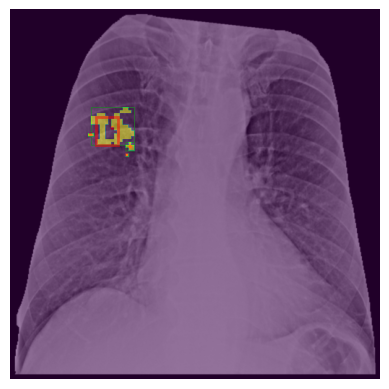

In [114]:
# curr_attr = non_zero_grey_full_occ_attr.transpose(2,0,1)[0]
curr_attr = cv2.threshold(grey_full_cv2_occ_attr,
              grey_full_cv2_occ_attr.max()*0.25, #ignore <25% activation
              grey_full_cv2_occ_attr.max(),
              cv2.THRESH_BINARY)[1].transpose(2,0,1)[0]
n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(curr_attr))
copy_img = convert_to_uint8(cv2_base_image.copy())
size_thresh = 1

size_thresh_idx = []
for i in range(1, n_labels): # start at 1 to ignore image centerpoint
    if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
        #print(stats[i, cv2.CC_STAT_AREA])
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
        cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=2)
        size_thresh_idx.append(i)




rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)
fig, ax = plt.subplots()

# Add the patch to the Axes
ax.imshow(copy_img)
ax.imshow(curr_attr, alpha=0.5)
ax.add_patch(rect)
ax.axis("off")

(-0.5, 511.5, 511.5, -0.5)

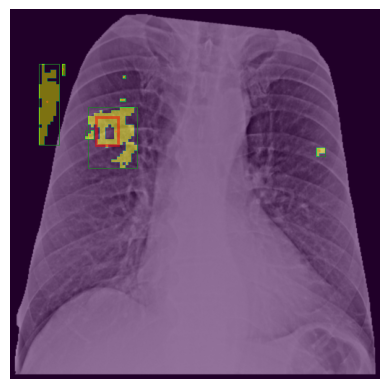

In [112]:
curr_attr = grey_full_thresh_occ_attr.transpose(2,0,1)[0]
n_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(convert_to_uint8(curr_attr))
copy_img = convert_to_uint8(cv2_base_image.copy())
size_thresh = 1

size_thresh_idx = []
for i in range(1, n_labels): # start at 1 to ignore image centerpoint
    if stats[i, cv2.CC_STAT_AREA] >= size_thresh:
        #print(stats[i, cv2.CC_STAT_AREA])
        x = stats[i, cv2.CC_STAT_LEFT]
        y = stats[i, cv2.CC_STAT_TOP]
        w = stats[i, cv2.CC_STAT_WIDTH]
        h = stats[i, cv2.CC_STAT_HEIGHT]
        cv2.rectangle(copy_img, (x, y), (x+w, y+h), (0, 255, 0), thickness=1)
        cv2.circle(copy_img, centroids[i].astype(int), 1, (255,0,0), thickness=1)
        size_thresh_idx.append(i)

rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)
fig, ax = plt.subplots()

# Add the patch to the Axes
ax.imshow(copy_img)
ax.imshow(curr_attr, alpha=0.5)
ax.add_patch(rect)
ax.axis("off")

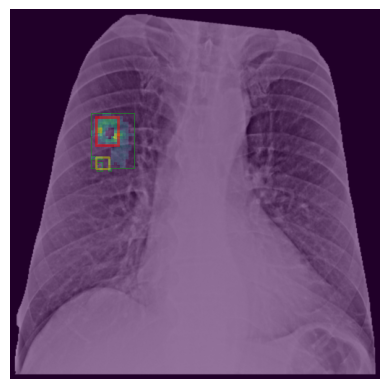

In [108]:
import numpy as np
from sklearn.cluster import DBSCAN

max_distance = 15
margin = 0

size_thresh_centroids = centroids[size_thresh_idx]
db = DBSCAN(eps=max_distance, min_samples=1).fit(size_thresh_centroids)
labels = db.labels_

binary_mask = grey_full_thresh_int_attr

# Calculate bounding boxes for each cluster
grouped_bboxes = []
unique_labels = np.unique(labels)

for label in unique_labels:
    cluster_points = size_thresh_centroids[labels == label]

    # Calculate the bounding box for the cluster
    x_min = np.min(cluster_points[:, 0])
    y_min = np.min(cluster_points[:, 1])
    x_max = np.max(cluster_points[:, 0])
    y_max = np.max(cluster_points[:, 1])

    # Apply margin to expand the bounding box
    x_min = max(0, x_min - margin)
    y_min = max(0, y_min - margin)
    x_max = min(binary_mask.shape[1] - 1, x_max + margin)
    y_max = min(binary_mask.shape[0] - 1, y_max + margin)

    grouped_bboxes.append((x_min, y_min, x_max, y_max))

copy_img2 = copy_img.copy()
# binary_mask = cv2.imread("your_mask.png", cv2.IMREAD_GRAYSCALE)


# Draw bounding boxes on the original image (or mask image)
for dbscan_bbox in grouped_bboxes:
    x_min, y_min, x_max, y_max = np.array(dbscan_bbox).astype(int)
    cv2.rectangle(copy_img2, (x_min, y_min), (x_max, y_max), (212, 255, 0), 2)

# # Show the result
# cv2.imshow("Grouped Bounding Boxes", binary_mask)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(copy_img2)

ax.imshow(non_zero_base_full_occ_attr.transpose(2,0,1)[0], alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")
plt.show()


In [119]:
get_area_thresheld_connected_components(non_zero_base_full_int_attr)

array([[141, 149],
       [130, 153],
       [138, 154],
       [136, 155],
       [141, 156],
       [129, 156],
       [133, 156],
       [122, 158],
       [127, 166],
       [135, 159],
       [140, 160],
       [144, 164],
       [147, 161],
       [120, 160],
       [152, 160],
       [134, 165],
       [139, 165],
       [123, 169],
       [148, 172],
       [154, 171],
       [158, 169],
       [142, 176],
       [137, 175],
       [152, 177],
       [133, 179],
       [139, 178],
       [155, 178],
       [144, 181],
       [136, 182],
       [135, 184],
       [143, 190],
       [395, 268],
       [412, 266],
       [413, 272],
       [391, 271],
       [402, 271],
       [407, 272],
       [391, 274],
       [394, 274],
       [406, 277]])

In [104]:
get_area_thresheld_connected_components(non_zero_base_full_occ_attr.transpose(2,0,1)[0])

array([[143, 177],
       [119, 205],
       [124, 217],
       [137, 221]])

In [103]:
cc_bboxes_by_dbscan(get_area_thresheld_connected_components(non_zero_base_full_occ_attr.transpose(2,0,1)[0]))

[]

In [117]:
get_area_thresheld_connected_components(cv2.threshold(grey_full_cv2_occ_attr,
              grey_full_cv2_occ_attr.max()*0.25, #ignore <25% activation
              grey_full_cv2_occ_attr.max(),
              cv2.THRESH_BINARY)[1].transpose(2,0,1)[0])

array([[141, 164],
       [111, 173],
       [166, 190],
       [161, 201]])

In [ ]:
def cc_bboxes_by_dbscan(centroids, max_distance=10, min_samples=1, margin=0, x_shape=512, y_shape=512):
    """Generate b"""
    db = DBSCAN(eps=max_distance, min_samples=1).fit(centroids)
    labels = db.labels_
    
    # Calculate bounding boxes for each cluster
    grouped_bboxes = []
    unique_labels = np.unique(labels)
    
    for label in unique_labels:
        cluster_points = centroids[labels == label]
        # Calculate the bounding box for the cluster
        x_min = np.min(cluster_points[:, 0])
        y_min = np.min(cluster_points[:, 1])
        x_max = np.max(cluster_points[:, 0])
        y_max = np.max(cluster_points[:, 1])
    
        # Apply margin to expand the bounding box
        x_min = max(0, x_min - margin)
        y_min = max(0, y_min - margin)
        x_max = min(x_shape - 1, x_max + margin)
        y_max = min(y_shape - 1, y_max + margin)

        if x_max-x_min > 0 and y_max-y_min > 0:
            grouped_bboxes.append((x_min, y_min, x_max, y_max))
    
    return grouped_bboxes

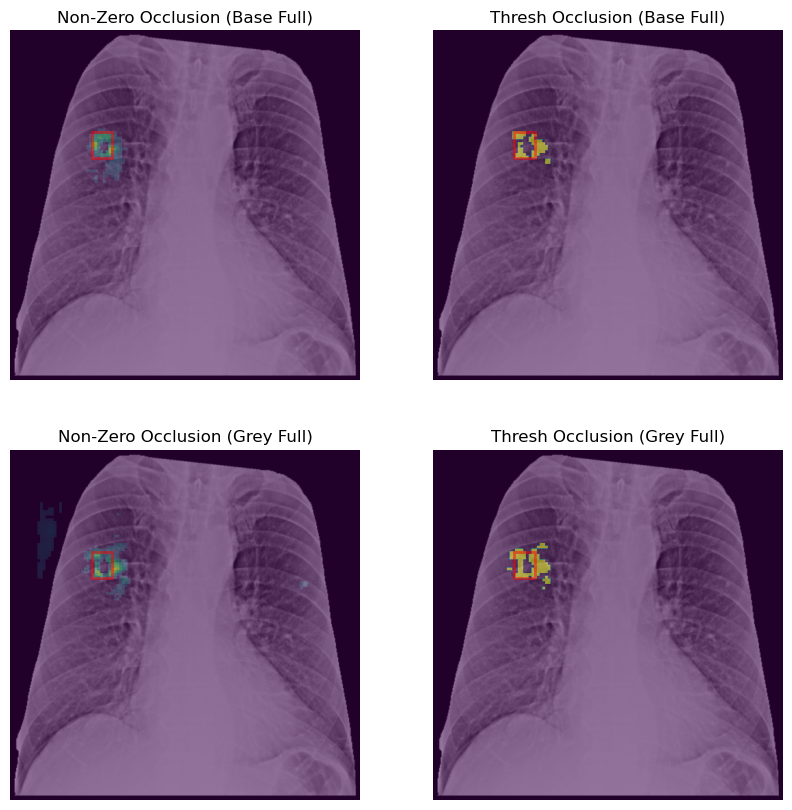

In [116]:
fig, ax = plt.subplots(2,2,figsize=(10, 10))

ax_list = [ax[0][0],ax[0][1],ax[1][0],ax[1][1]]
attr_list = [non_zero_base_full_occ_attr.transpose(2,0,1)[0], 
             cv2.threshold(grey_full_cv2_occ_attr,
              base_full_cv2_occ_attr.max()*0.25, #ignore <25% activation
              base_full_cv2_occ_attr.max(),
              cv2.THRESH_BINARY)[1].transpose(2,0,1)[0],
             non_zero_grey_full_occ_attr.transpose(2,0,1)[0], 
             cv2.threshold(grey_full_cv2_occ_attr,
              grey_full_cv2_occ_attr.max()*0.25, #ignore <25% activation
              grey_full_cv2_occ_attr.max(),
              cv2.THRESH_BINARY)[1].transpose(2,0,1)[0]]
title_list = ["Non-Zero Occlusion (Base Full)",
              "Thresh Occlusion (Base Full)",
              "Non-Zero Occlusion (Grey Full)",
              "Thresh Occlusion (Grey Full)",]
bbox = pos_curr_bbox
img = convert_to_uint8(cv2_base_image.copy())
for [attribution, ax, title] in zip(attr_list, ax_list, title_list):
    gen_vis_cc_bboxes(attribution, img, bbox, ax, title)

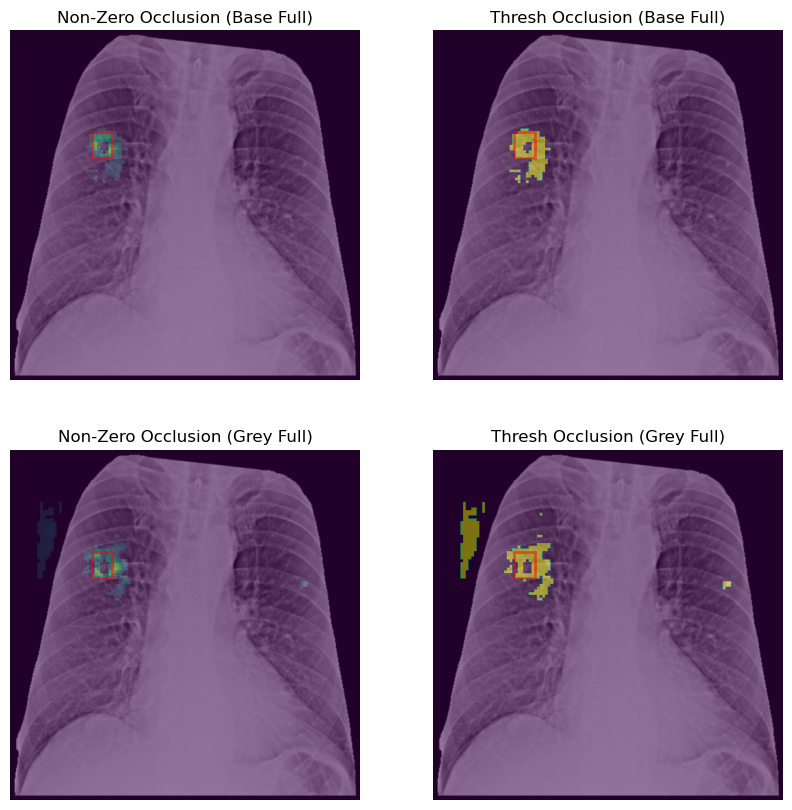

In [102]:
fig, ax = plt.subplots(2,2,figsize=(10, 10))

ax_list = [ax[0][0],ax[0][1],ax[1][0],ax[1][1]]
attr_list = [non_zero_base_full_occ_attr.transpose(2,0,1)[0], 
             base_full_thresh_occ_attr.transpose(2,0,1)[0],
             non_zero_grey_full_occ_attr.transpose(2,0,1)[0], 
             grey_full_thresh_occ_attr.transpose(2,0,1)[0]]
title_list = ["Non-Zero Occlusion (Base Full)",
              "Thresh Occlusion (Base Full)",
              "Non-Zero Occlusion (Grey Full)",
              "Thresh Occlusion (Grey Full)",]
bbox = pos_curr_bbox
img = convert_to_uint8(cv2_base_image.copy())
for [attribution, ax, title] in zip(attr_list, ax_list, title_list):
    gen_vis_cc_bboxes(attribution, img, bbox, ax, title)
    


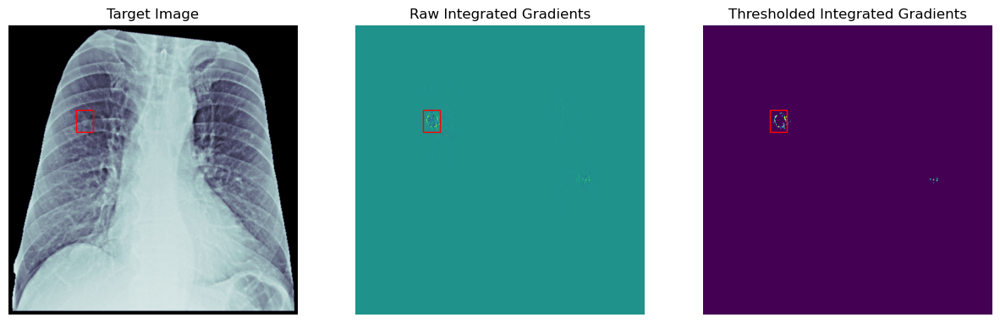

In [50]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,3,figsize=(15, 40))

# Display the image
ax[0].imshow(pos_inputs[0][0].cpu(),cmap="bone")
# ax[0].imshow(cv2_occ_attr.transpose(2,0,1)[0], cmap='viridis', alpha=0.3, vmin=-0.1, vmax=1)
ax[1].imshow(cv2_int_attr, cmap="viridis")#, vmin=-0.1, vmax=1)#,cmap="magma")
ax[2].imshow(thresh_int_attr,cmap="viridis")#, vmin=-0.1, vmax=1)#,cmap="magma")

# Add the rect to the Axes
ax[0].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=1))
ax[1].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=1))
ax[2].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=1))

ax[0].set_title('Target Image')
ax[1].set_title('Raw Integrated Gradients')
ax[2].set_title('Thresholded Integrated Gradients')
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")

plt.show()

##### Visualise Integrated Gradient Contours

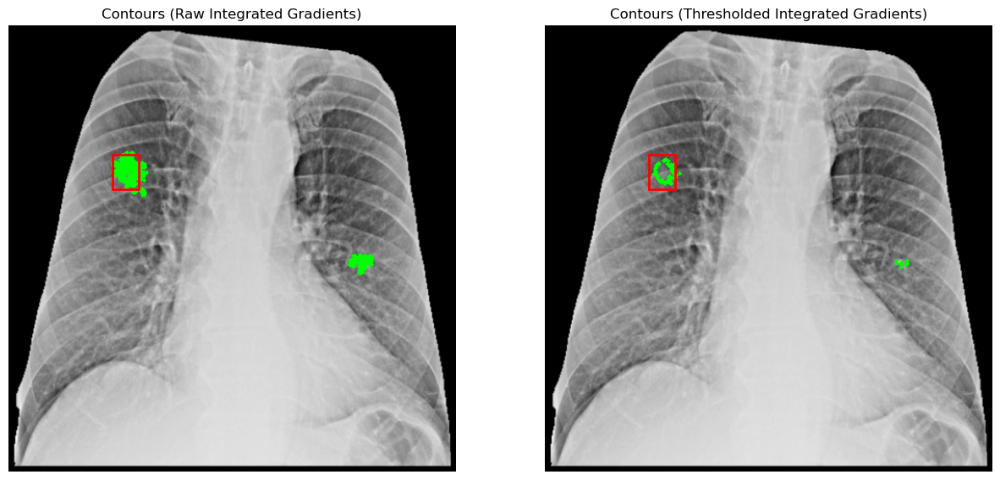

In [51]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,2,figsize=(15, 30))

# https://stackoverflow.com/questions/46260601/convert-image-from-cv-64f-to-cv-8u
# uint8_int_attr = cv2_int_attr-cv2_int_attr.min()
# uint8_int_attr = uint8_int_attr / uint8_int_attr.max() * 255
# uint8_int_attr = uint8_int_attr.astype(np.uint8)
uint8_int_attr = convert_to_uint8(cv2_int_attr)

# https://docs.opencv.org/3.4/df/d0d/tutorial_find_contours.html
canny_int_attr = cv2.blur(uint8_int_attr, (3,3))
canny_thresh = 28
# detect edges
canny_mask = cv2.Canny(canny_int_attr,canny_thresh, canny_thresh*2)
contours, hierarchy = cv2.findContours(canny_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
for contour in contours:
   cv2.drawContours(contour_img, contour, -1, (0, 255, 0), 3)
ax[0].imshow(contour_img)

contours, _ = cv2.findContours(convert_to_uint8(conv_int_attr), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = normalize8(cv2_base_image.copy())
for contour in contours:
   cv2.drawContours(contour_img, contour, -1, (0, 255, 0), 3)
ax[1].imshow(contour_img)

# Add the rect to the Axes
ax[0].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=2))
ax[1].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=2))

ax[0].set_title('Contours (Raw Integrated Gradients)')
ax[1].set_title('Contours (Thresholded Integrated Gradients)')

ax[0].axis("off")
ax[1].axis("off")


plt.show()

In [143]:
import cv2
import numpy as np
from sklearn.cluster import DBSCAN

def generate_bounding_boxes_with_dbscan(binary_mask, max_distance, margin=5):
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate centroids
    centroids = []
    for contour in contours:
        M = cv2.moments(contour)
        if M['m00'] != 0:
            c_x = int(M['m10'] / M['m00'])
            c_y = int(M['m01'] / M['m00'])
            centroids.append((c_x, c_y))

    centroids = np.array(centroids)
    # DBSCAN clustering
    db = DBSCAN(eps=max_distance, min_samples=1).fit(centroids)
    labels = db.labels_

    # Calculate bounding boxes for each cluster
    grouped_bboxes = []
    unique_labels = np.unique(labels)

    for label in unique_labels:
        cluster_points = centroids[labels == label]

        # Calculate the bounding box for the cluster
        x_min = np.min(cluster_points[:, 0])
        y_min = np.min(cluster_points[:, 1])
        x_max = np.max(cluster_points[:, 0])
        y_max = np.max(cluster_points[:, 1])

        # Apply margin to expand the bounding box
        x_min = max(0, x_min - margin)
        y_min = max(0, y_min - margin)
        x_max = min(binary_mask.shape[1] - 1, x_max + margin)
        y_max = min(binary_mask.shape[0] - 1, y_max + margin)

        grouped_bboxes.append((x_min, y_min, x_max, y_max))

    return grouped_bboxes


[[407 273]
 [413 274]
 [139 179]
 [133 178]
 [148 174]
 [142 177]
 [147 162]
 [144 164]
 [127 162]]


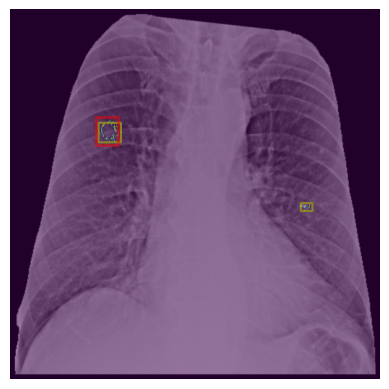

In [56]:
# Example usage
copy_img = convert_to_uint8(cv2_base_image.copy())
# binary_mask = cv2.imread("your_mask.png", cv2.IMREAD_GRAYSCALE)
binary_mask = thresh_int_attr
max_distance = 20  # Set max distance for DBSCAN clustering (tune this)
dbscan_bboxes = generate_bounding_boxes_with_dbscan(conv_int_attr, max_distance)

# Draw bounding boxes on the original image (or mask image)
for dbscan_bbox in dbscan_bboxes:
    x_min, y_min, x_max, y_max = dbscan_bbox
    cv2.rectangle(copy_img, (x_min, y_min), (x_max, y_max), (212, 255, 0), 2)

# # Show the result
# cv2.imshow("Grouped Bounding Boxes", binary_mask)
# cv2.waitKey(0)
# cv2.destroyAllWindows()
# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(copy_img)

ax.imshow(binary_mask, alpha=0.5)
rect = patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor=(1,0,0,0.5),
                         facecolor='none',lw=2)

# Add the patch to the Axes
ax.add_patch(rect)
ax.axis("off")
plt.show()


In [155]:
from torchvision.ops import masks_to_boxes

boxes = masks_to_boxes((int_attrs[0]))
# boxes = masks_to_boxes((cv2.threshold(cv2_occ_attr,cv2_occ_attr.max()*0.25,cv2_attr.max(),cv2.THRESH_BINARY)[1]))

print(boxes.size())
print(boxes)

torch.Size([3, 4])
tensor([[  0.,   0., 511., 511.],
        [  0.,   0., 511., 511.],
        [  0.,   0., 511., 511.]], device='cuda:0')


##### Visualise Occlusion Attributions

In [23]:
thresh_occ_attr = cv2.threshold(cv2_occ_attr.transpose(2,0,1)[0],
                                0.5,#cv2_occ_attr.max()*0.25, #ignore <25% activation
                                cv2_occ_attr.max(),
                                cv2.THRESH_BINARY)[1]

conv_occ_attr = (thresh_occ_attr*8).astype(np.uint8)

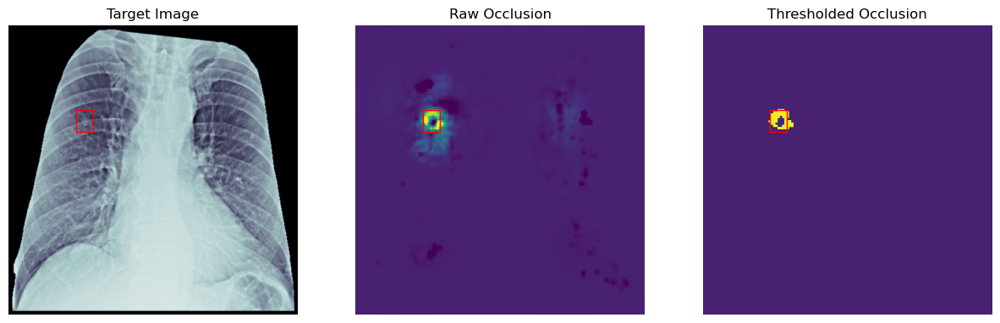

In [24]:
import matplotlib.patches as patches

# Create figure and axes
fig, ax = plt.subplots(1,3,figsize=(15, 40))

# Display the image

ax[0].imshow(pos_inputs[0][0].cpu(),cmap="bone")
# ax[0].imshow(cv2_occ_attr.transpose(2,0,1)[0], cmap='viridis', alpha=0.3, vmin=-0.1, vmax=1)
ax[1].imshow(cv2_occ_attr.transpose(2,0,1)[0], cmap="viridis", vmin=-0.1, vmax=1)#,cmap="magma")
ax[2].imshow(thresh_occ_attr,cmap="viridis", vmin=-0.1, vmax=1)#,cmap="magma")

# Add the rect to the Axes
ax[0].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=1))
ax[1].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=1))
ax[2].add_patch(patches.Rectangle((pos_curr_bbox[0],pos_curr_bbox[1]),pos_curr_bbox[2],pos_curr_bbox[3],edgecolor='red', facecolor='none',lw=1))

ax[0].set_title('Target Image')
ax[1].set_title('Raw Occlusion')
ax[2].set_title('Thresholded Occlusion')
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")

plt.show()

##### Visualise Occlusion Contours